In [1]:
# Import dependencies

import os
import wandb
import wandb_workspaces.workspaces as ws
import wandb_workspaces.reports.v2 as wr # We use the Reports API for adding panels

%load_ext autoreload
%autoreload 2


In [2]:
WANDB_API_KEY = "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"
ENTITY = "kirill456z"
PROJECT = "physics4llm"

if WANDB_API_KEY:
    os.environ["WANDB_API_KEY"] = WANDB_API_KEY
if ENTITY:
    os.environ["WANDB_ENTITY"] = ENTITY

In [3]:
report = wr.Report.from_url("https://wandb.ai/kirill456z/physics4llm/reports/16-03--VmlldzoxNjE5ODYwNw")

report.width = 'fluid'

wandb: [wandb.Api()] Loaded credentials for https://api.wandb.ai from WANDB_API_KEY.


[to_matplotlib] Loaded 3 runs


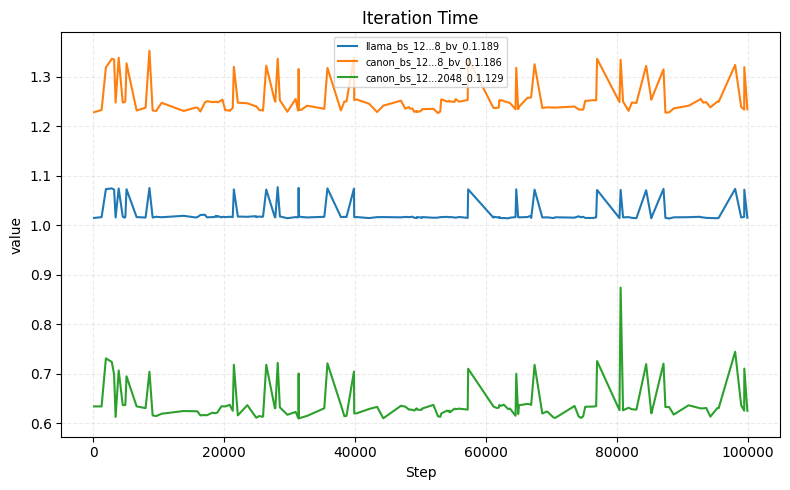

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/tokenizer_speed_current_iter_time.png
[to_matplotlib] Loaded 3 runs


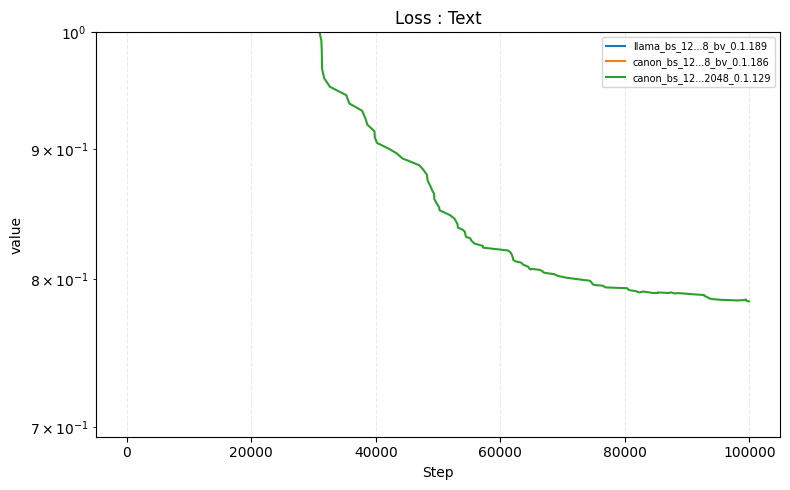

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/tokenizer_loss.png
[to_matplotlib] Loaded 2 runs


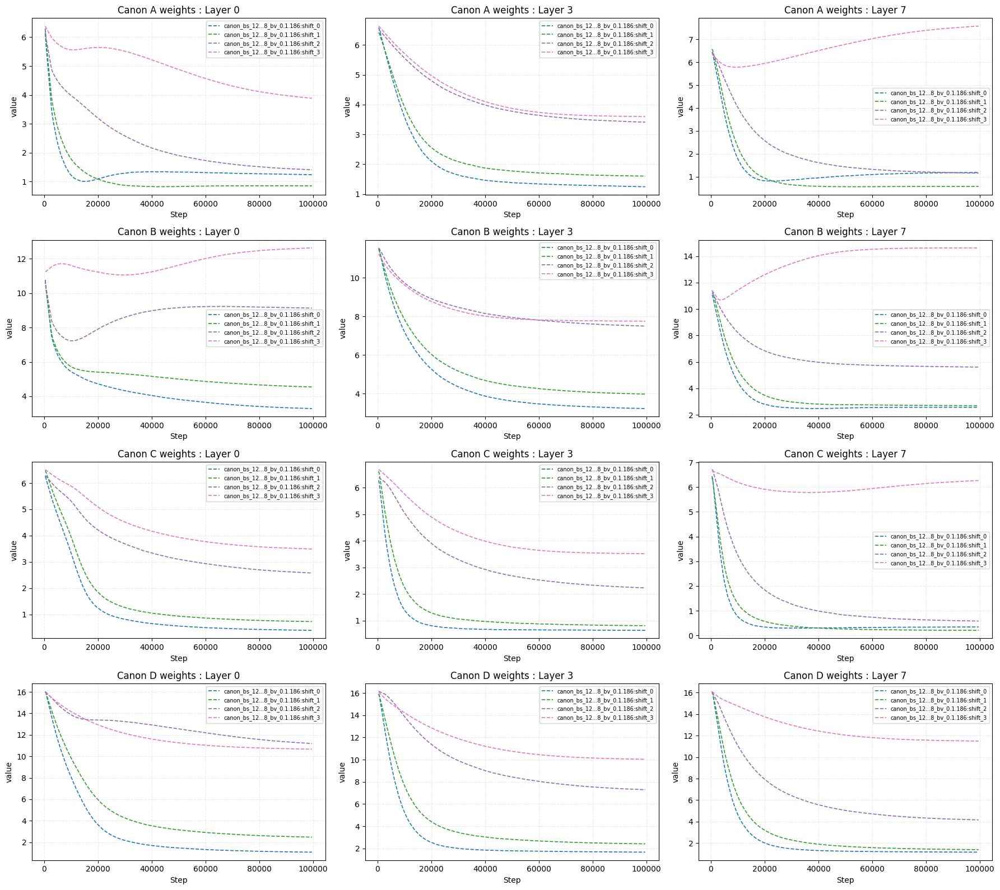

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/dynamics_canon_weights_layerwise.png
[to_matplotlib] Loaded 2 runs


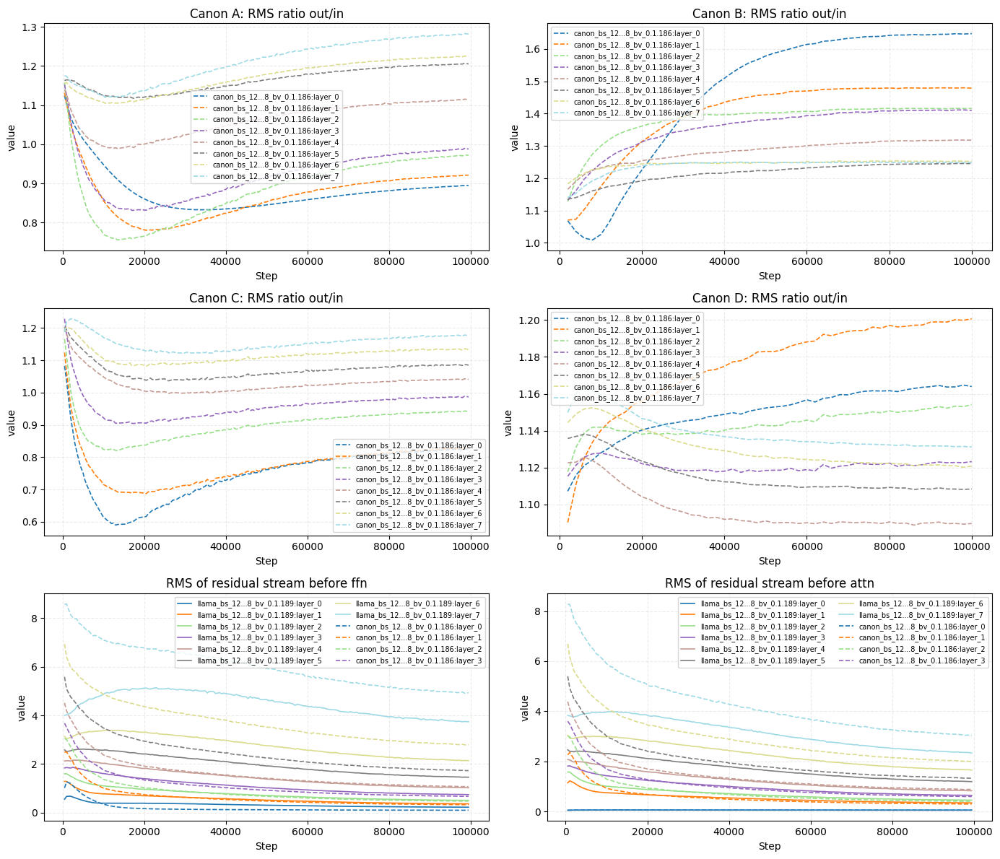

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/dynamics_rms_ratio_and_residual.png
[to_matplotlib] Loaded 2 runs


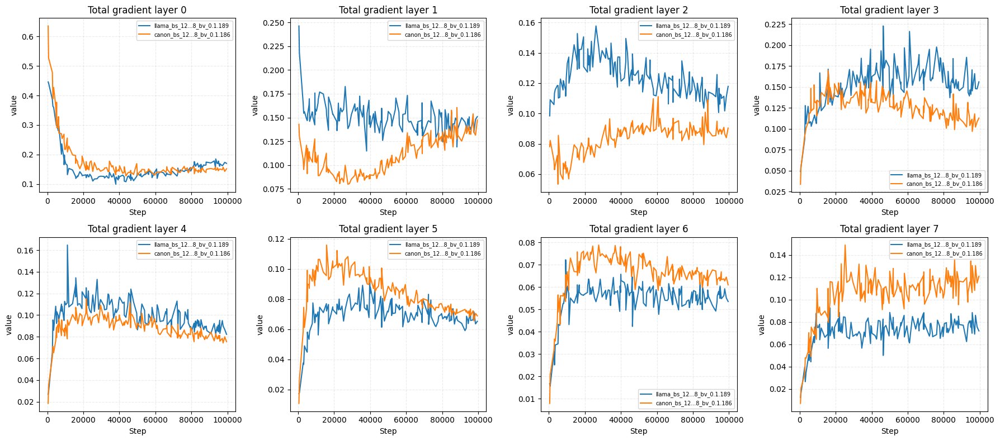

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/dynamics_grad_contrib.png
[to_matplotlib] Loaded 2 runs


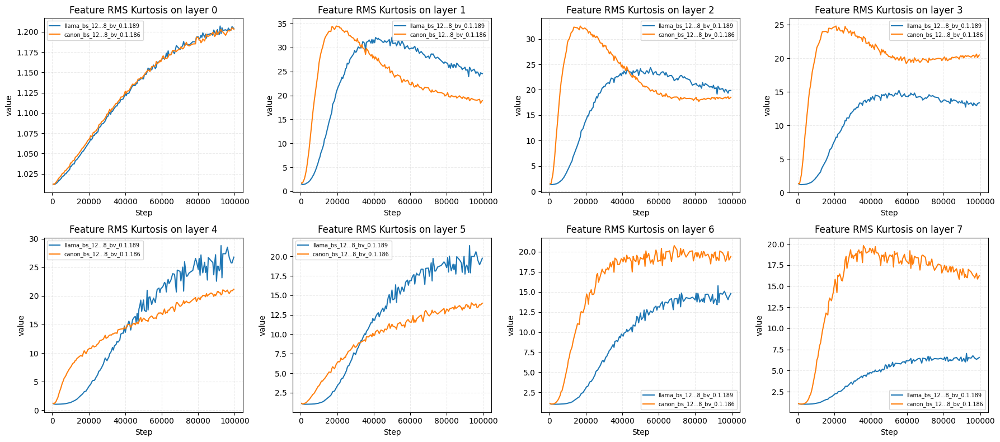

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/dynamics_outlier_features_kurtosis.png
[to_matplotlib] Loaded 2 runs


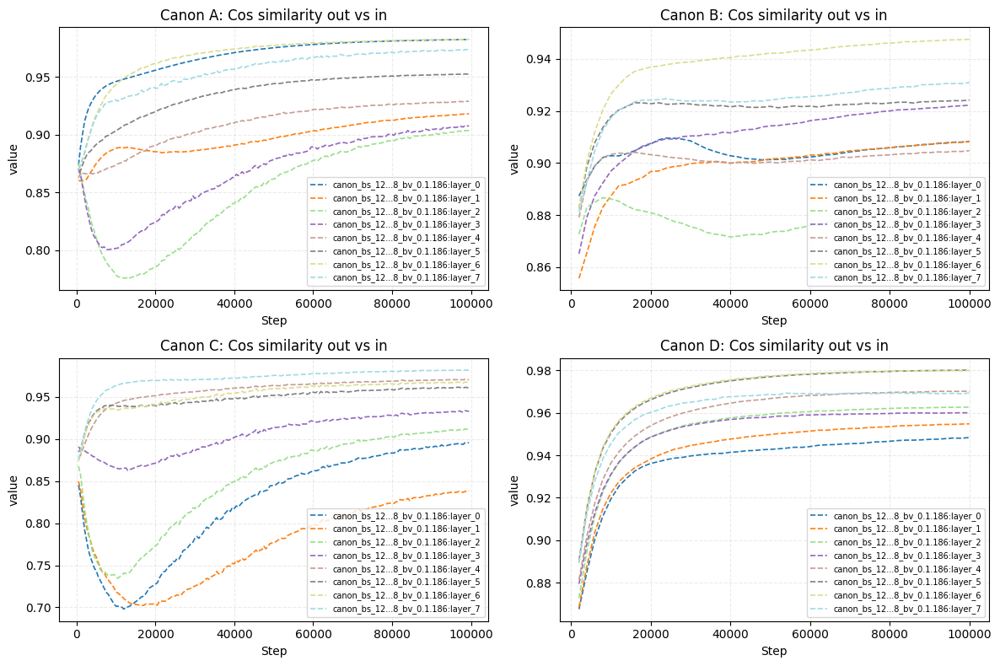

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/dynamics_canon_cos_similarity.png


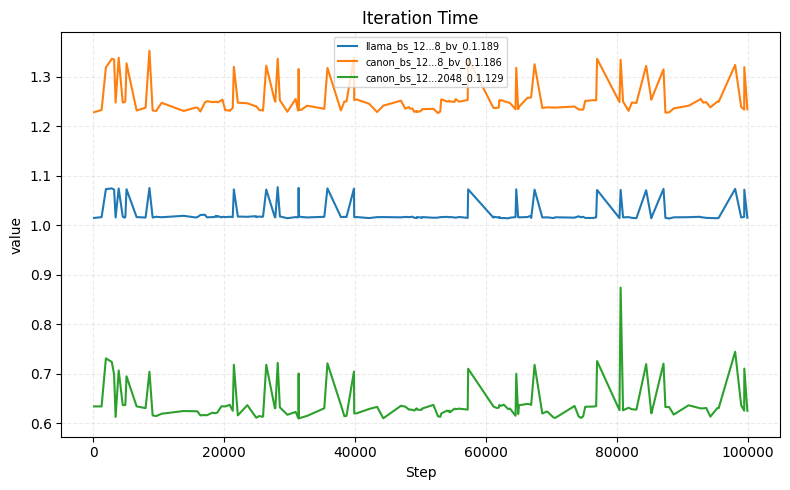

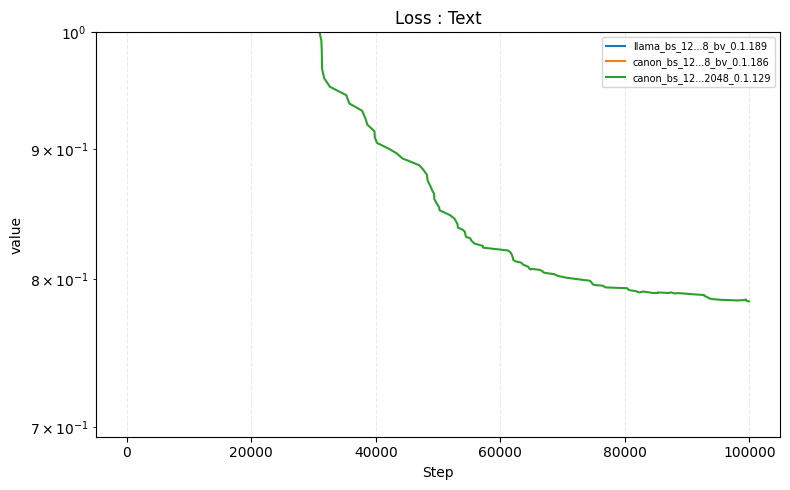

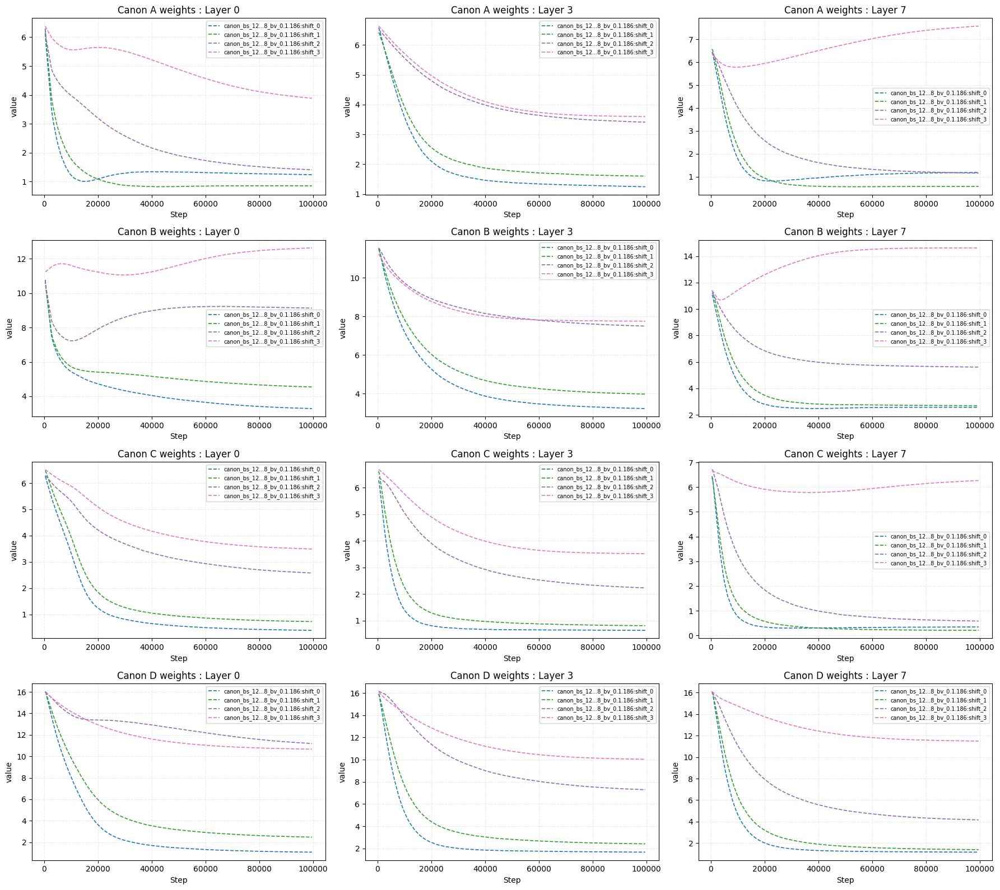

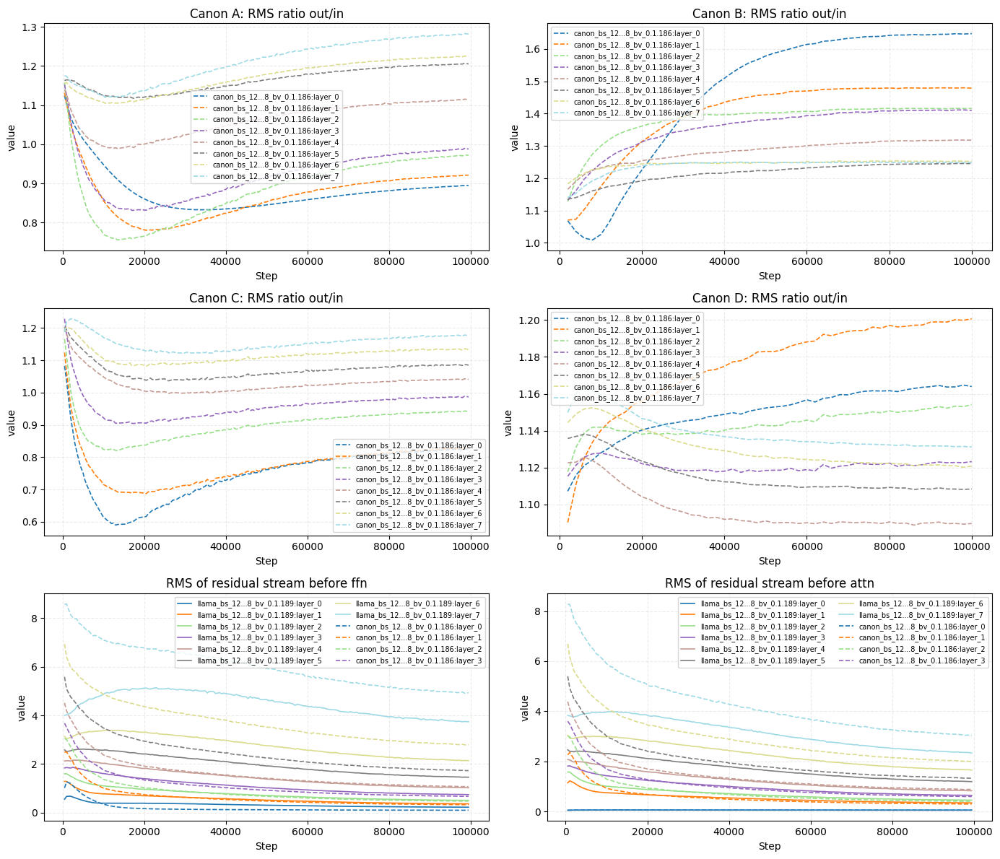

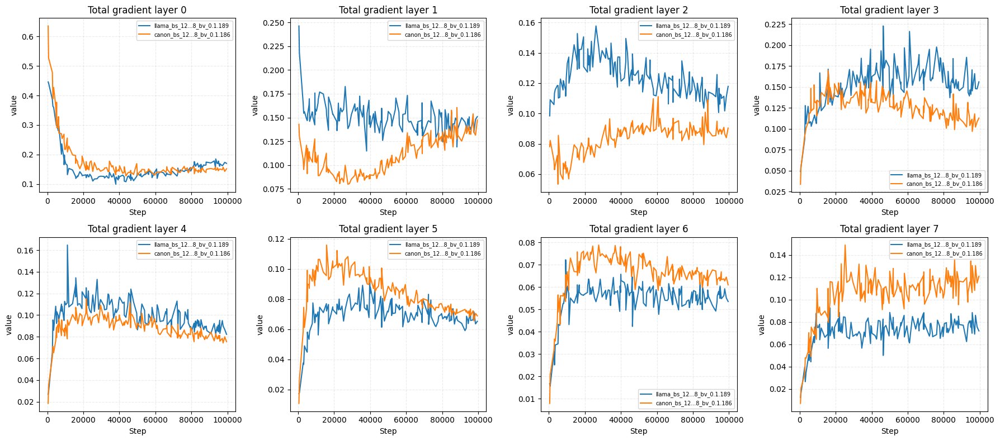

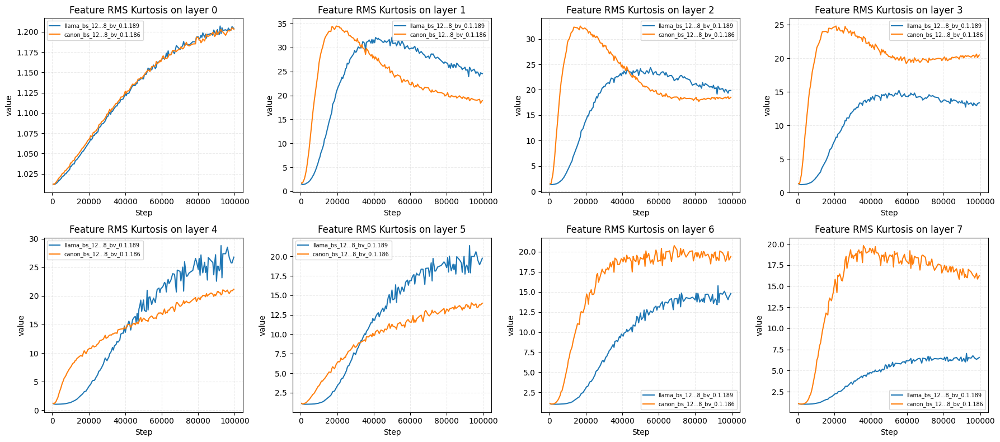

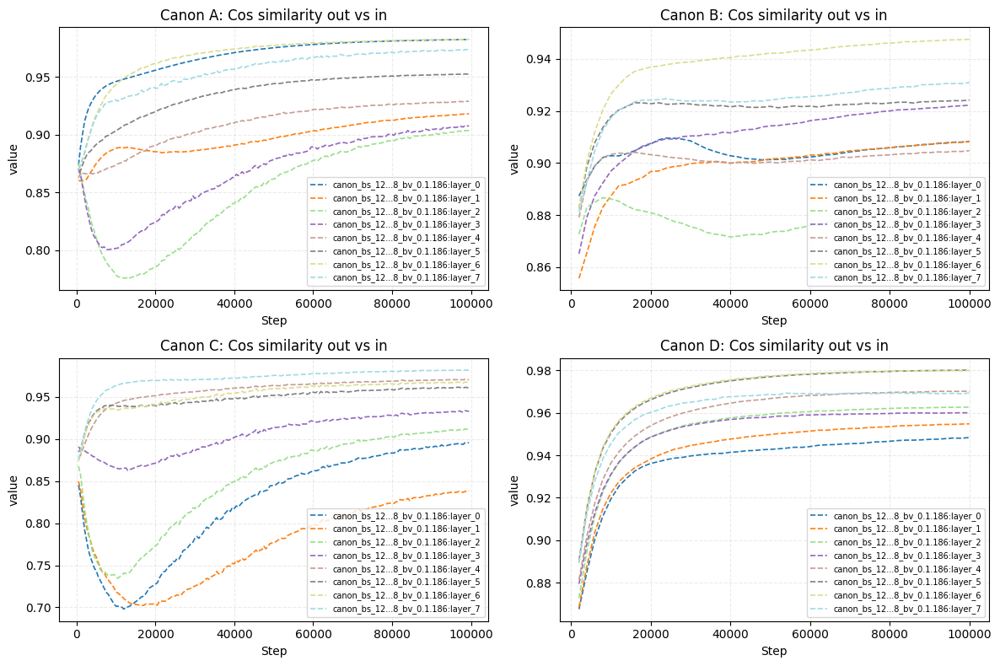

In [4]:
from plots import canon_weight_fixed_layer, speed_cur_iter_time
from plots import loss_lineplot, to_matplotlib
from runsets import RunsetsFactory

runsets_factory = RunsetsFactory(ENTITY, PROJECT)
FAST_PLOT_KWARGS = dict(api_timeout=90, max_points_per_series=150, use_scan_fallback=False)


gpt2_vocab_speed_comp = [
    "text_llama_bs_128_seq_len_2048_0.1.189", #text_ks_4_default_init_with_residual_trainable_bs_128_seq_len_2048_0.1.129
    "text_ks_4_default_init_with_residual_trainable_bs_128_seq_len_2048_0.1.186", #text_llama_bs_128_seq_len_2048_0.1.130,
    "canon_text_0.1.129"
]



runs_speed_comp = [runsets_factory.filter_by_run_names(gpt2_vocab_speed_comp)]
speed_current_iter_time = [
    speed_cur_iter_time()
]

speed_fig, speed_path = to_matplotlib(
    speed_current_iter_time,
    runs_speed_comp,
    num_subplots_h=1,
    num_subplots_w=1,
    h=5,
    w=8,
    output_name="tokenizer_speed_current_iter_time",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {speed_path}")

loss_plots = [loss_lineplot()]
loss_fig, loss_path = to_matplotlib(
    loss_plots,
    runs_speed_comp,
    num_subplots_h=1,
    num_subplots_w=1,
    h=5,
    w=8,
    output_name="tokenizer_loss",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {loss_path}")

report.blocks = [
    wr.H2("Training with gpt2 tokenizer"),
    wr.P("Much slower"),
    wr.PanelGrid(
        runsets = runs_speed_comp,
        panels = speed_current_iter_time,
        hide_run_sets = True
    ),
    wr.P("Loss"),
    wr.PanelGrid(
        runsets = runs_speed_comp,
        panels = loss_plots,
        hide_run_sets = True
    )
]

dynamics_observation_runs = [
    "text_llama_bs_128_seq_len_2048_0.1.189", #text_ks_4_default_init_with_residual_trainable_bs_128_seq_len_2048_0.1.129
    "text_ks_4_default_init_with_residual_trainable_bs_128_seq_len_2048_0.1.186" #text_llama_bs_128_seq_len_2048_0.1.130,
]
runs = [runsets_factory.filter_by_run_names(dynamics_observation_runs)] 

canon_weights_layerwise = [
    canon_weight_fixed_layer("A", 0),
    canon_weight_fixed_layer("A", 3),
    canon_weight_fixed_layer("A", 7),
    canon_weight_fixed_layer("B", 0),
    canon_weight_fixed_layer("B", 3),
    canon_weight_fixed_layer("B", 7),
    canon_weight_fixed_layer("C", 0),
    canon_weight_fixed_layer("C", 3),
    canon_weight_fixed_layer("C", 7),
    canon_weight_fixed_layer("D", 0),
    canon_weight_fixed_layer("D", 3),
    canon_weight_fixed_layer("D", 7),
]

canon_fig, canon_path = to_matplotlib(
    canon_weights_layerwise,
    runs,
    num_subplots_h=4,
    num_subplots_w=3,
    h=16,
    w=18,
    output_name="dynamics_canon_weights_layerwise",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {canon_path}")

report.blocks += [
    wr.P("No significant qualitative difference"),
    wr.H3(text="Higher canon weights on farther tokens ✅"),
    wr.PanelGrid(
        runsets = runs,
        panels = canon_weights_layerwise,
        hide_run_sets = True
    )
]

### RMS ratio
from plots import canon_rms_ratio, residual_rms, realign_grid

plots = [
    canon_rms_ratio("A"),
    canon_rms_ratio("B"),
    canon_rms_ratio("C"),
    canon_rms_ratio("D"),
    residual_rms("ffn"),
    residual_rms("attn")
]

plots = realign_grid(plots, num_columns = 2, total_w = 25, plot_h = 7)
rms_fig, rms_path = to_matplotlib(
    plots,
    runs,
    num_subplots_h=3,
    num_subplots_w=2,
    h=12,
    w=14,
    output_name="dynamics_rms_ratio_and_residual",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {rms_path}")

report.blocks += [
    wr.H3(text="Canon upscales representations ✅"),
    wr.P(text="A and C canon upscale later layers more than early ones"),
    wr.PanelGrid(
        runsets = runs,
        panels = plots,
        hide_run_sets = True,
    )
]

### Higher gradients on further layers
from plots import grad_contrib

grad_plots = [
    grad_contrib(layer_idx) for layer_idx in range(0, 8)
]

grad_plots = realign_grid(grad_plots, num_columns = 4, total_w = 25, plot_h = 7)
grad_fig, grad_path = to_matplotlib(
    grad_plots,
    runs,
    num_subplots_h=2,
    num_subplots_w=4,
    h=8,
    w=18,
    output_name="dynamics_grad_contrib",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {grad_path}")

report.blocks += [
    wr.P(text="And increases gradients on deeper layers ✅"),
    wr.PanelGrid(
        runsets = runs,
        panels = grad_plots,
        hide_run_sets = True,
    )
]

### Outlier features

from plots import outlier_features_kurtosis

outlier_plots = [
    outlier_features_kurtosis(layer_idx) for layer_idx in range(0, 8)
]

outlier_plots = realign_grid(outlier_plots, num_columns = 4, total_w = 25, plot_h = 7)
outlier_fig, outlier_path = to_matplotlib(
    outlier_plots,
    runs,
    num_subplots_h=2,
    num_subplots_w=4,
    h=8,
    w=18,
    output_name="dynamics_outlier_features_kurtosis",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {outlier_path}")

report.blocks += [
    wr.H3("Much more uniform features ❌"),
    wr.P("Except for layer 0 ..."),
    wr.PanelGrid(
        runsets = runs,
        panels = outlier_plots,
        hide_run_sets = True,
    )
]

### Cos sim

from plots import cos_sim

cos_plots = [
    cos_sim(canon_type) for canon_type in ["A", "B", "C", "D"]
]
cos_plots = realign_grid(cos_plots, num_columns = 2, total_w = 25, plot_h = 7)
cos_fig, cos_path = to_matplotlib(
    cos_plots,
    runs,
    num_subplots_h=2,
    num_subplots_w=2,
    h=8,
    w=12,
    output_name="dynamics_canon_cos_similarity",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {cos_path}")

report.blocks += [
    wr.H3(text="More mixing on first layers and in canons A, C ✅"),
    wr.PanelGrid(
        runsets = runs,
        panels = cos_plots,
        hide_run_sets = True,
    )
]


### Canon Layer ablation

[to_matplotlib] Loaded 4 runs


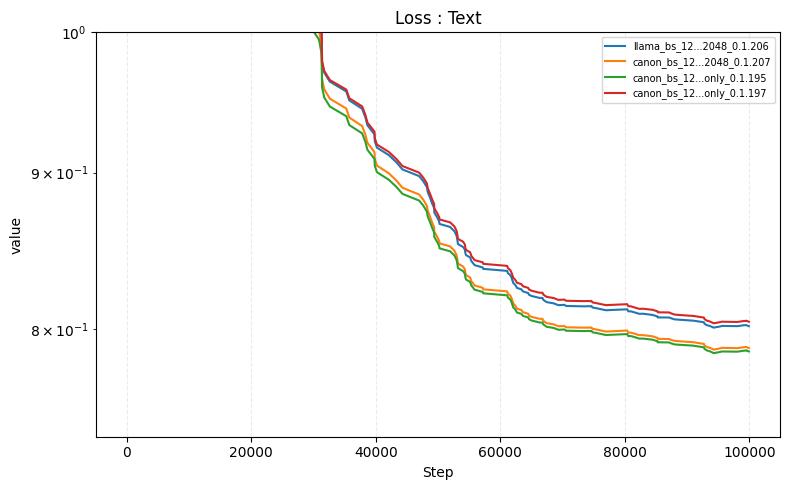

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/ablation_canon_layer_loss.png


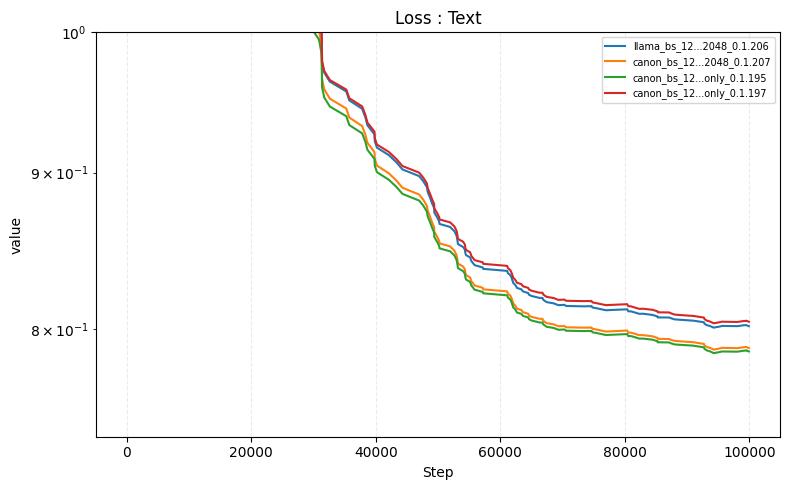

In [5]:
from plots import loss_lineplot, to_matplotlib

runsets_factory = RunsetsFactory(ENTITY, PROJECT)
FAST_PLOT_KWARGS = dict(api_timeout=90, max_points_per_series=150, use_scan_fallback=False)

run_names = [
    "text_llama_bs_128_seq_len_2048_0.1.206", # Baseline
    "text_ks_4_default_init_with_residual_trainable_bs_128_seq_len_2048_0.1.207", # All layers
    "text_ks_4_default_init_with_residual_trainable_bs_128_seq_len_2048_0.1.195", # First layer only
    "text_ks_4_default_init_with_residual_trainable_bs_128_seq_len_2048_0.1.197" # last layer only
]

runs = [runsets_factory.filter_by_run_names(run_names)]

layer_ablation_plots = [loss_lineplot()]
layer_ablation_fig, layer_ablation_path = to_matplotlib(
    layer_ablation_plots,
    runs,
    num_subplots_h=1,
    num_subplots_w=1,
    h=5,
    w=8,
    output_name="ablation_canon_layer_loss",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {layer_ablation_path}")

report.blocks += [
    wr.H2("Canon Layer Ablation"),
    wr.PanelGrid(
        runsets = runs,
        panels = layer_ablation_plots,
        hide_run_sets = True
    )
]

### Normalization type ablation

[to_matplotlib] Loaded 6 runs


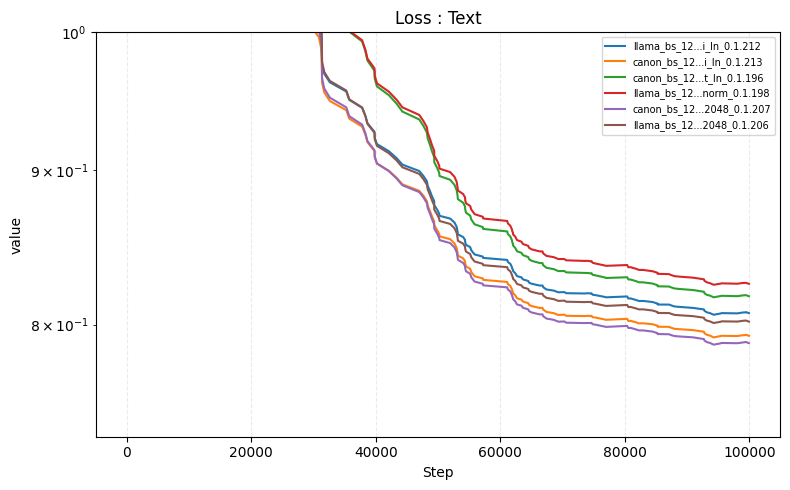

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/norm_types_loss.png
[to_matplotlib] Loaded 2 runs


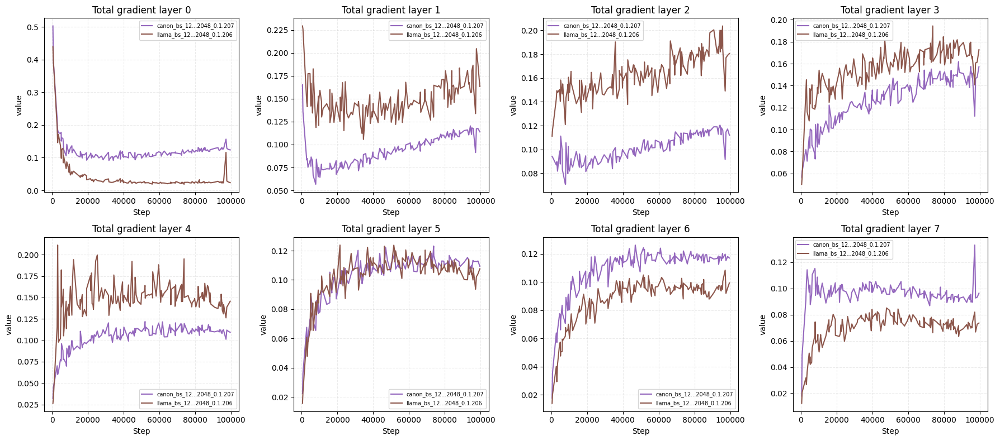

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/norm_gradients_pre_ln.png
[to_matplotlib] Loaded 2 runs


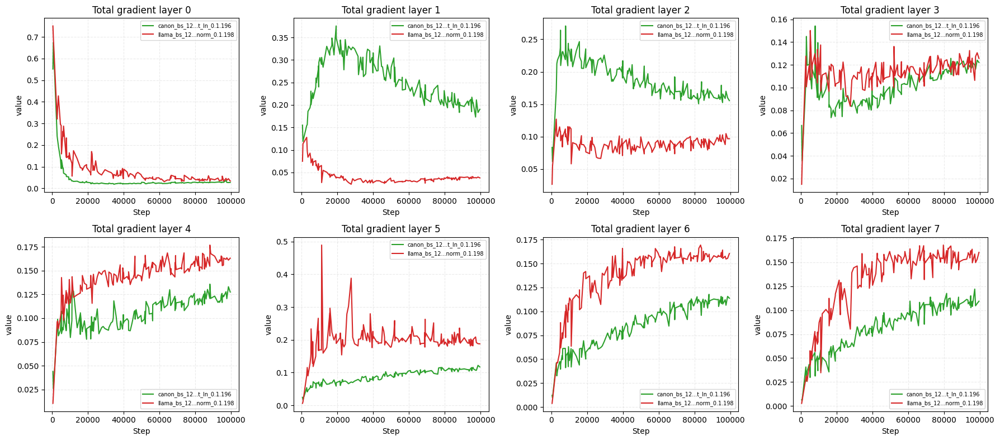

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/norm_gradients_post_ln.png
[to_matplotlib] Loaded 2 runs


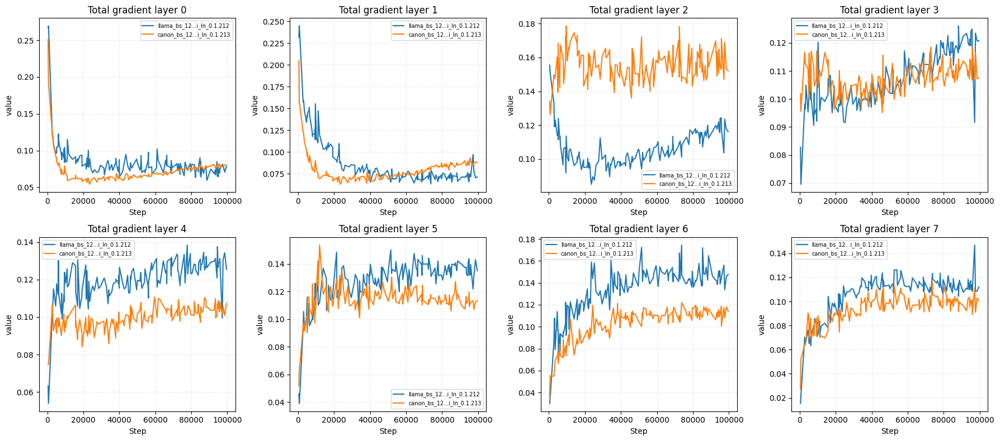

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/norm_gradients_peri_ln.png
[to_matplotlib] Loaded 2 runs


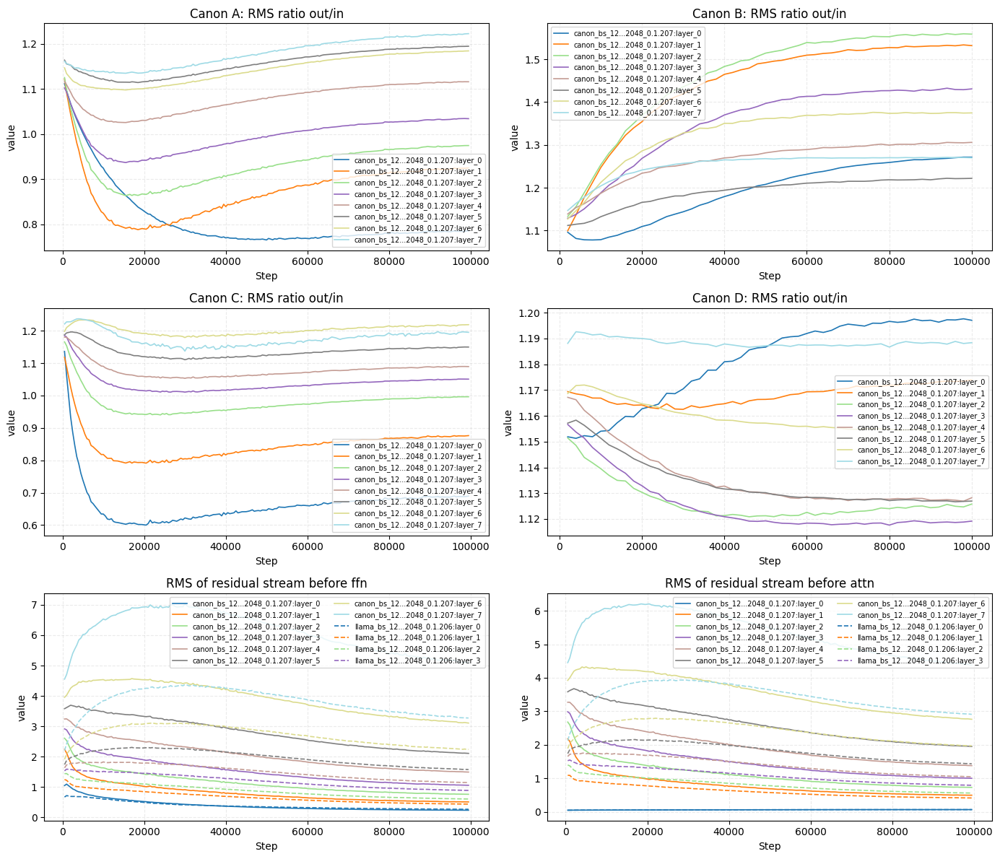

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/norm_repr_scale_pre_ln.png
[to_matplotlib] Loaded 2 runs
[to_matplotlib] Empty subplot 'Canon A: RMS ratio out/in' | runs=2 | y_keys=['canon_align/rms_ratio/canonA/layer_0', 'canon_align/rms_ratio/canonA/layer_1', 'canon_align/rms_ratio/canonA/layer_2', 'canon_align/rms_ratio/canonA/layer_3', 'canon_align/rms_ratio/canonA/layer_4', 'canon_align/rms_ratio/canonA/layer_5', 'canon_align/rms_ratio/canonA/layer_6', 'canon_align/rms_ratio/canonA/layer_7'] | points=0
[to_matplotlib] Empty subplot 'Canon C: RMS ratio out/in' | runs=2 | y_keys=['canon_align/rms_ratio/canonC/layer_0', 'canon_align/rms_ratio/canonC/layer_1', 'canon_align/rms_ratio/canonC/layer_2', 'canon_align/rms_ratio/canonC/layer_3', 'canon_align/rms_ratio/canonC/layer_4', 'canon_align/rms_ratio/canonC/layer_5', 'canon_align/rms_ratio/canonC/layer_6', 'canon_align/rms_ratio/canonC/layer_7'] | points=0


/Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots.py:493: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  fig.tight_layout()


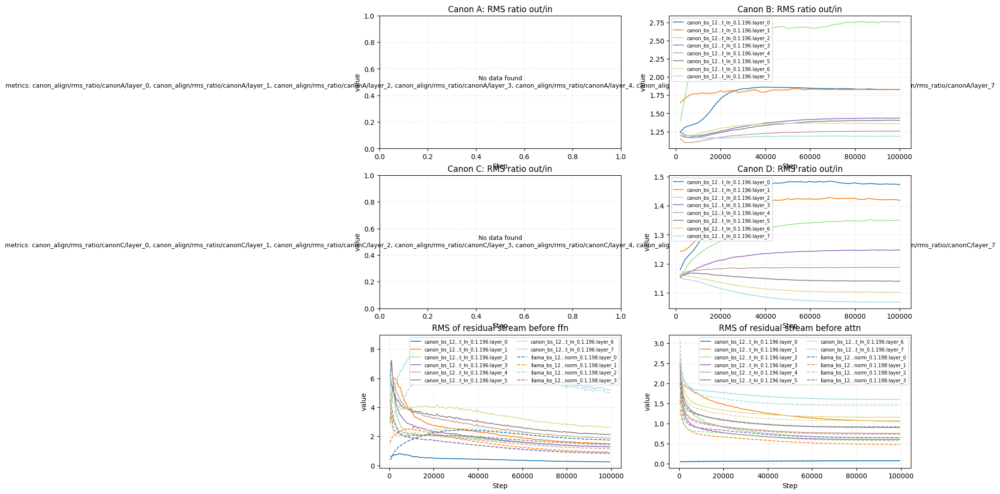

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/norm_repr_scale_post_ln.png
[to_matplotlib] Loaded 2 runs


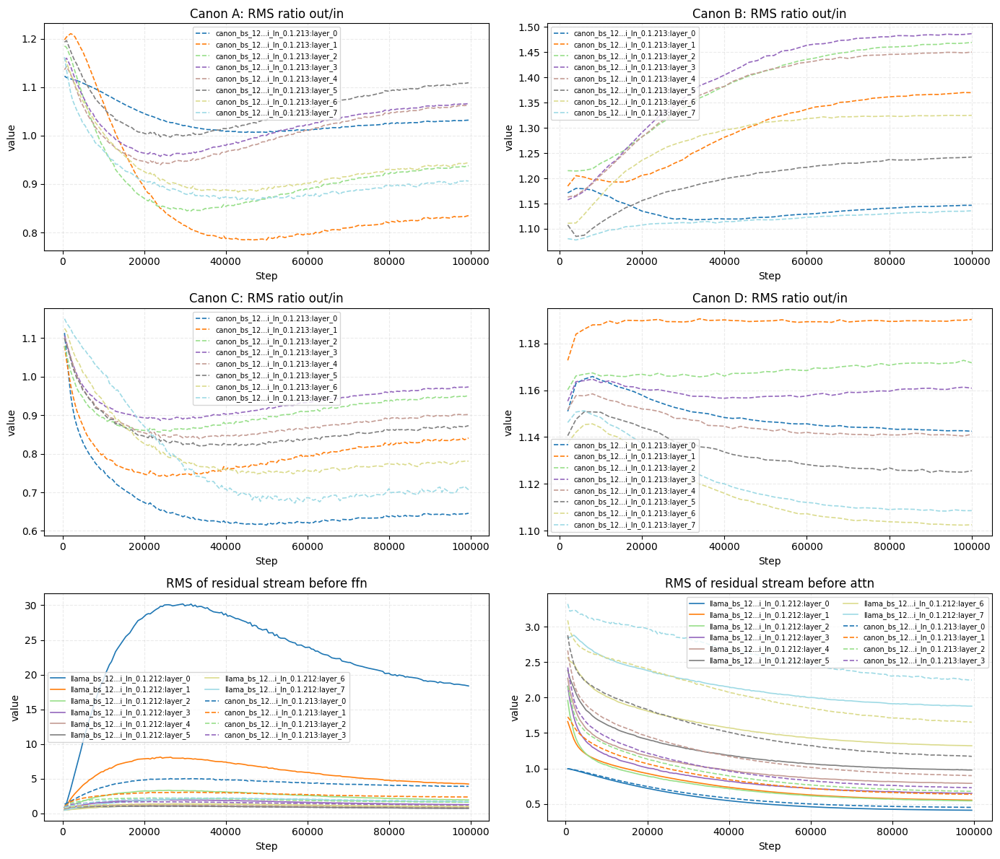

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/norm_repr_scale_peri_ln.png
[to_matplotlib] Loaded 6 runs


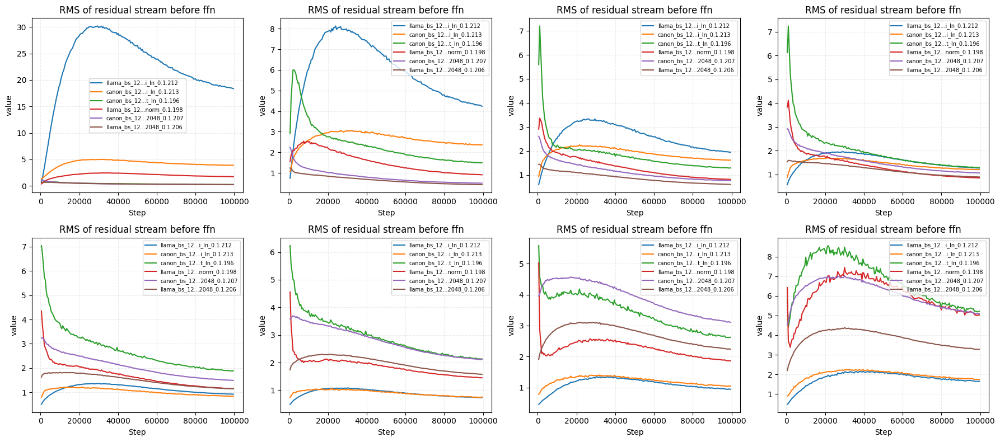

Saved: /Users/kirillzemlanskij/Workspace/PhysicsLM4/reports/plots/norm_residual_rms_ffn.png


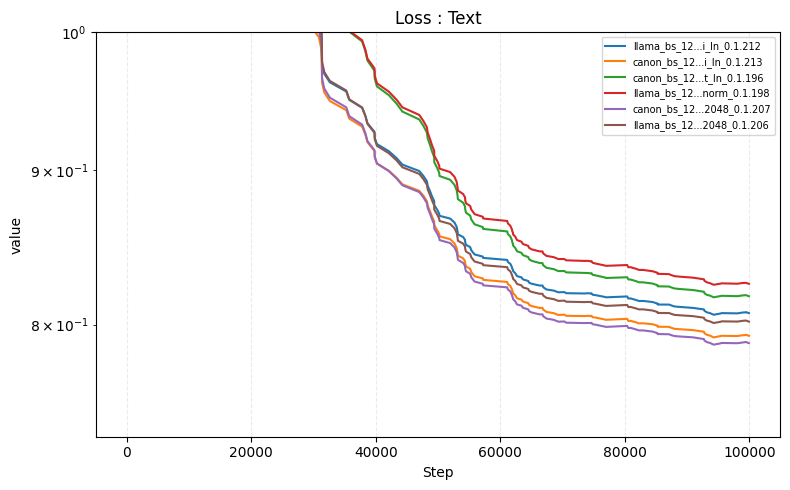

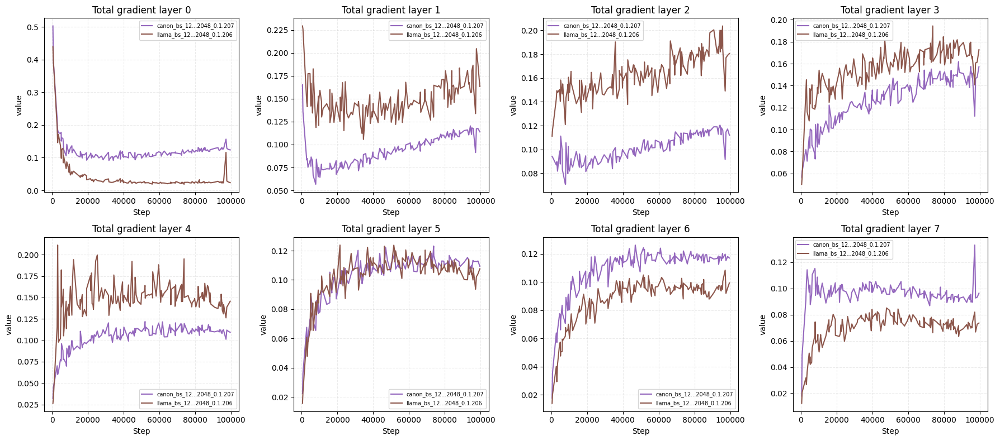

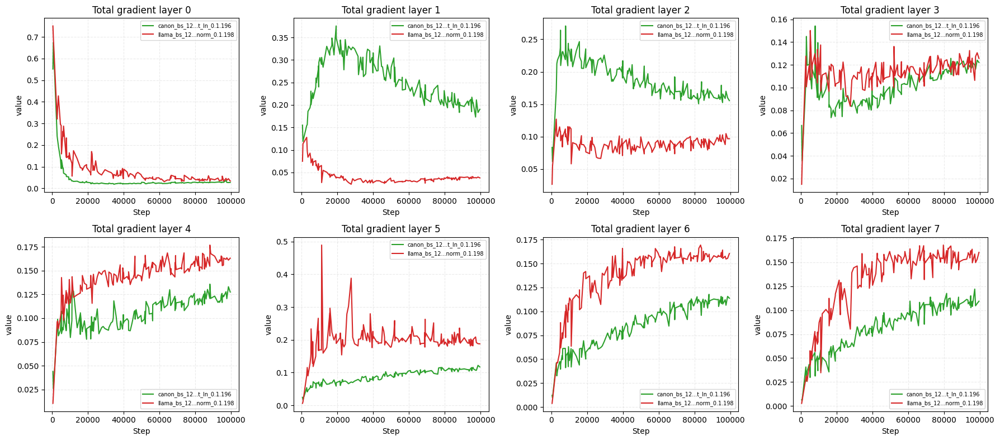

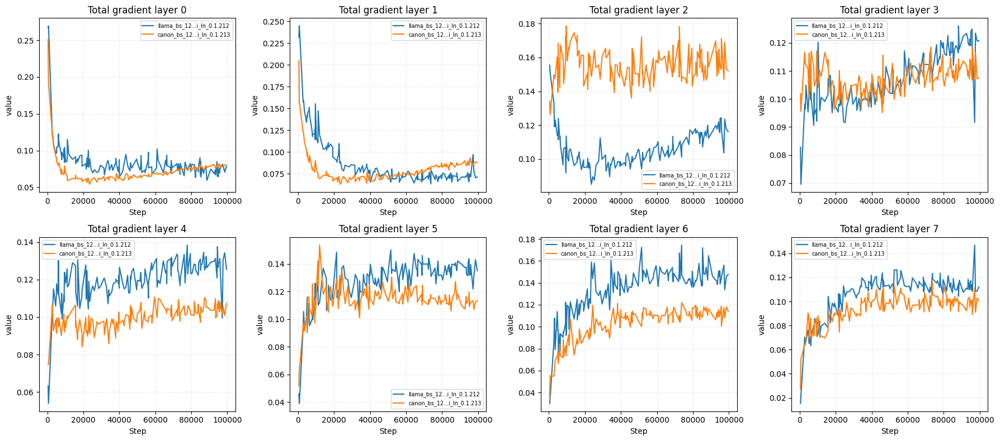

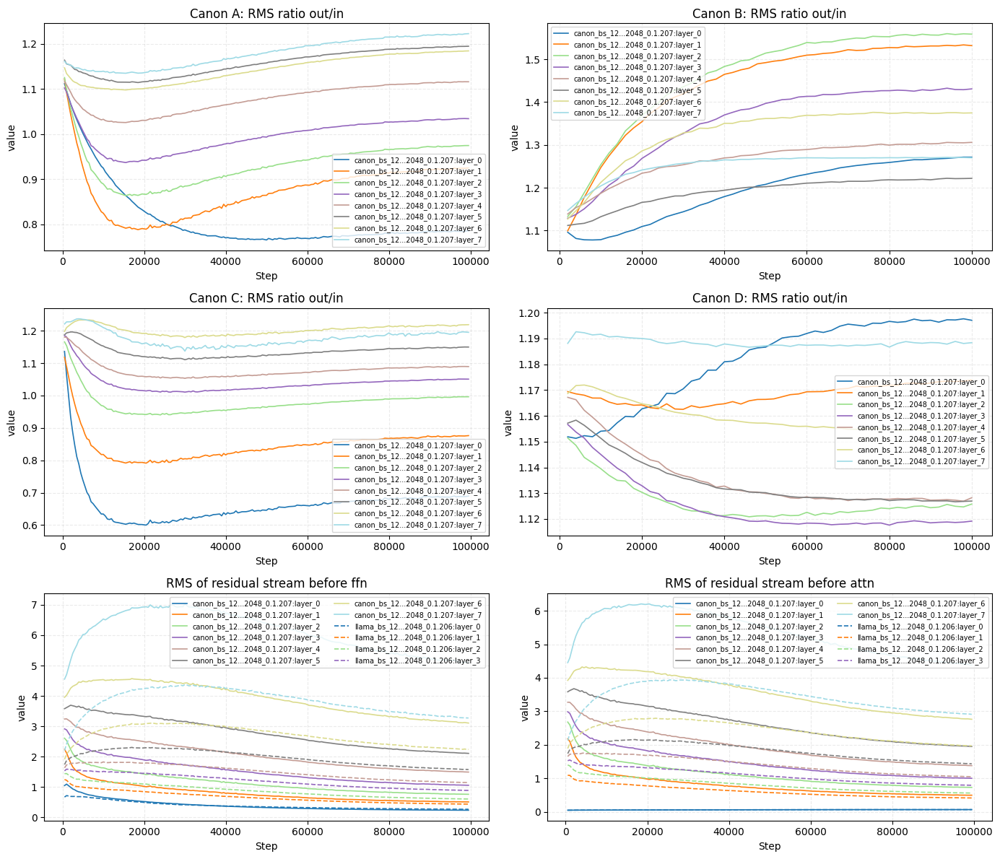

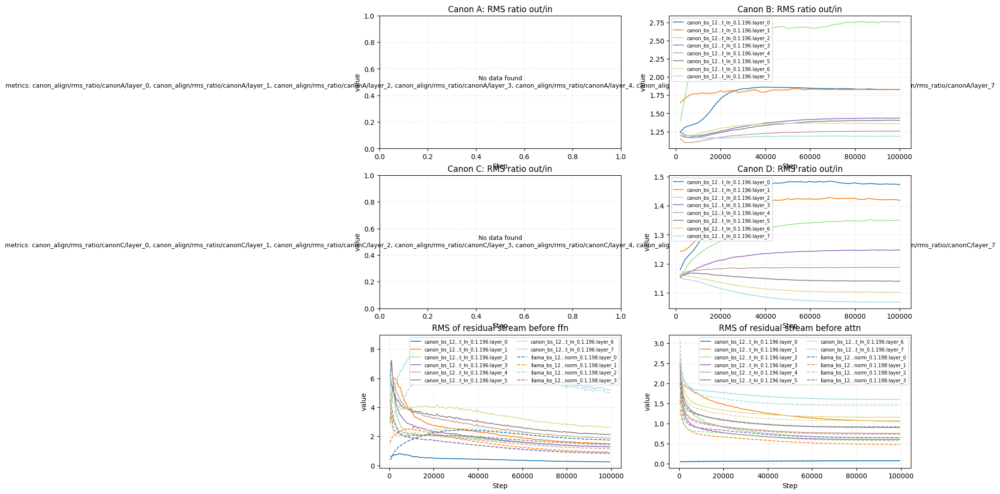

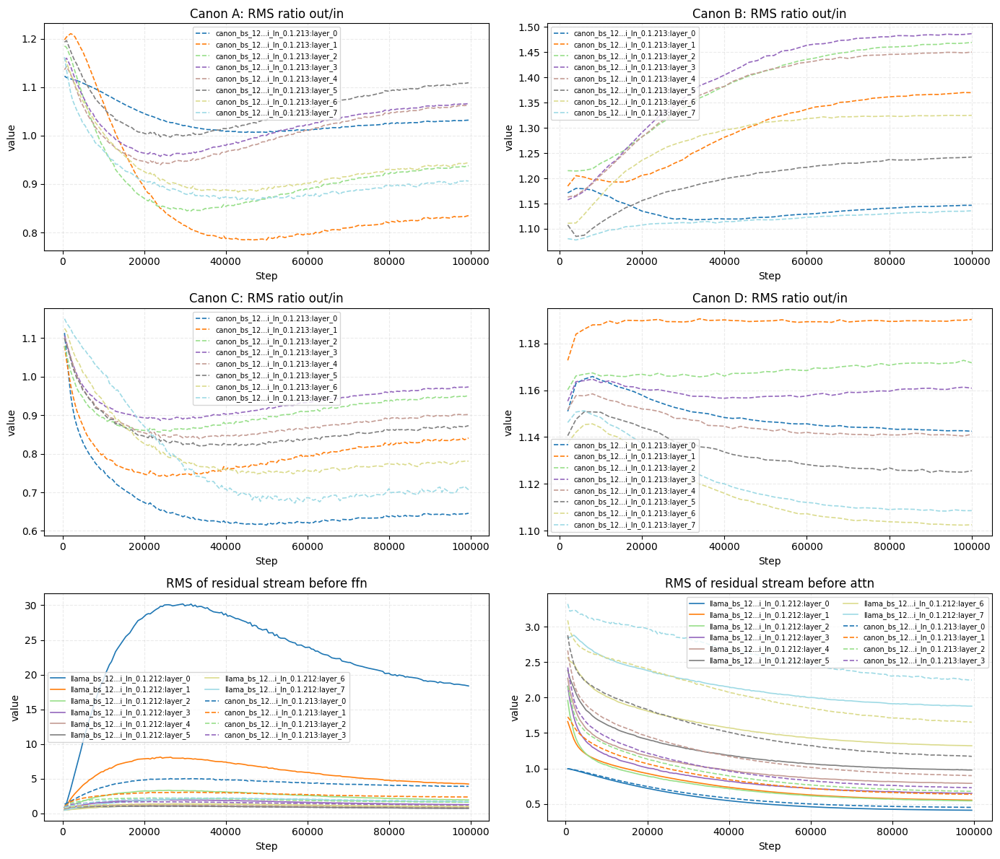

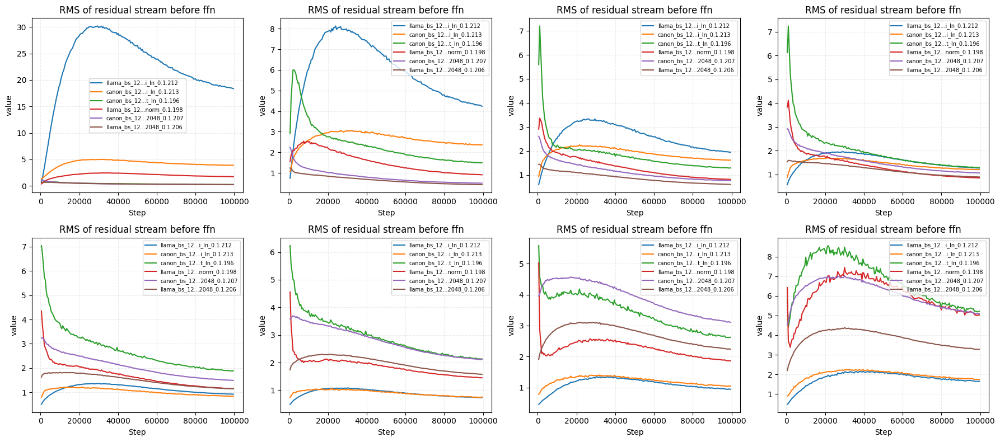

In [6]:
from plots import loss_lineplot, to_matplotlib

runsets_factory = RunsetsFactory(ENTITY, PROJECT)
FAST_PLOT_KWARGS = dict(api_timeout=90, max_points_per_series=150, use_scan_fallback=False)

run_names_peri = [
    "text_llama_bs_128_seq_len_2048_0.1.212", # Peri-LN llama
    "text_ks_4_default_init_with_residual_trainable_bs_128_seq_len_2048_0.1.213" #Peri-LN canon
] 
run_names_pre = [
    "text_ks_4_default_init_with_residual_trainable_bs_128_seq_len_2048_0.1.207", # Pre-LN Canon
    "text_llama_bs_128_seq_len_2048_0.1.206", # Pre-LN LLama
]
run_names_post = [
    "text_ks_4_default_init_with_residual_trainable_bs_128_seq_len_2048_0.1.196", # Post-LN Canon 
    "text_llama_bs_128_seq_len_2048_0.1.198", # Post-LN LLama,
]
run_names = run_names_peri + run_names_post + run_names_pre

runs = [runsets_factory.filter_by_run_names(run_names)]
runs_peri = [runsets_factory.filter_by_run_names(run_names_peri)]
runs_pre = [runsets_factory.filter_by_run_names(run_names_pre)]
runs_post = [runsets_factory.filter_by_run_names(run_names_post)]

norm_loss_plots = [loss_lineplot()]
norm_loss_fig, norm_loss_path = to_matplotlib(
    norm_loss_plots,
    runs,
    num_subplots_h=1,
    num_subplots_w=1,
    h=5,
    w=8,
    output_name="norm_types_loss",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {norm_loss_path}")

report.blocks += [
    wr.H2("Normalization types"),
    wr.PanelGrid(
        runsets = runs,
        panels = norm_loss_plots,
        hide_run_sets = True
    )
]

from plots import grad_contrib

grad_norm_plots = [
    grad_contrib(layer_idx) for layer_idx in range(0, 8)
]

grad_norm_plots = realign_grid(grad_norm_plots, num_columns = 4, total_w = 25, plot_h = 7)
grad_pre_fig, grad_pre_path = to_matplotlib(
    grad_norm_plots,
    runs_pre,
    num_subplots_h=2,
    num_subplots_w=4,
    h=8,
    w=18,
    output_name="norm_gradients_pre_ln",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {grad_pre_path}")

grad_post_fig, grad_post_path = to_matplotlib(
    grad_norm_plots,
    runs_post,
    num_subplots_h=2,
    num_subplots_w=4,
    h=8,
    w=18,
    output_name="norm_gradients_post_ln",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {grad_post_path}")

grad_peri_fig, grad_peri_path = to_matplotlib(
    grad_norm_plots,
    runs_peri,
    num_subplots_h=2,
    num_subplots_w=4,
    h=8,
    w=18,
    output_name="norm_gradients_peri_ln",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {grad_peri_path}")

report.blocks += [
    wr.H3(text="Gradients"),
    wr.P("Pre-LN"),
    wr.PanelGrid(
        runsets = runs_pre,
        panels = grad_norm_plots,
        hide_run_sets = True,
    ),
    wr.P("Post-LN"),
    wr.PanelGrid(
        runsets = runs_post,
        panels = grad_norm_plots,
        hide_run_sets = True,
    ),
    wr.P("Peri-LN"),
    wr.PanelGrid(
        runsets = runs_peri,
        panels = grad_norm_plots,
        hide_run_sets = True,
    ),
]

from plots import canon_rms_ratio, residual_rms, realign_grid


rms_norm_plots = [
    canon_rms_ratio("A"),
    canon_rms_ratio("B"),
    canon_rms_ratio("C"),
    canon_rms_ratio("D"),
    residual_rms("ffn"),
    residual_rms("attn")
]

rms_norm_plots = realign_grid(rms_norm_plots, num_columns = 2, total_w = 25, plot_h = 7)
rms_pre_fig, rms_pre_path = to_matplotlib(
    rms_norm_plots,
    runs_pre,
    num_subplots_h=3,
    num_subplots_w=2,
    h=12,
    w=14,
    output_name="norm_repr_scale_pre_ln",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {rms_pre_path}")

rms_post_fig, rms_post_path = to_matplotlib(
    rms_norm_plots,
    runs_post,
    num_subplots_h=3,
    num_subplots_w=2,
    h=12,
    w=14,
    output_name="norm_repr_scale_post_ln",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {rms_post_path}")

rms_peri_fig, rms_peri_path = to_matplotlib(
    rms_norm_plots,
    runs_peri,
    num_subplots_h=3,
    num_subplots_w=2,
    h=12,
    w=14,
    output_name="norm_repr_scale_peri_ln",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {rms_peri_path}")

report.blocks += [
    wr.H3(text="Representations scale"),
    wr.P("Pre-LN"),
    wr.PanelGrid(
        runsets = runs_pre,
        panels = rms_norm_plots,
        hide_run_sets = True,
    ),
    wr.P("Post-LN"),
    wr.PanelGrid(
        runsets = runs_post,
        panels = rms_norm_plots,
        hide_run_sets = True,
    ),
    wr.P("Peri-LN"),
    wr.PanelGrid(
        runsets = runs_peri,
        panels = rms_norm_plots,
        hide_run_sets = True,
    ),
]


residual_rms_plots = [
    residual_rms("ffn", [i]) for i in range(0, 8)
]

residual_rms_plots = realign_grid(residual_rms_plots, num_columns = 4, total_w = 25, plot_h = 7)
residual_rms_fig, residual_rms_path = to_matplotlib(
    residual_rms_plots,
    runs,
    num_subplots_h=2,
    num_subplots_w=4,
    h=8,
    w=18,
    output_name="norm_residual_rms_ffn",
    **FAST_PLOT_KWARGS,
)
print(f"Saved: {residual_rms_path}")

report.blocks += [
    wr.H3(text="RMS of residuals"),
    wr.PanelGrid(
        runsets = runs,
        panels = residual_rms_plots,
        hide_run_sets = True,
    )
]

In [7]:
report.save();


wandb: Saved report to: https://wandb.ai/kirill456z/physics4llm/reports/16.03--VmlldzoxNjE5ODYwNw==
